# UMAPs Neurips samples, NK cells

In this notebook UMAPs are generated from latent space, CLR transformed protein counts and RNA expression to compare the clustering results. 

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot
from pySankey import sankey

import warnings

warnings.filterwarnings('ignore')



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


# 1. Latent space

## 1.1 UMAPs, latent space

In [3]:
#Neurips
adata_neurips_latent = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [4]:
#Both NK cell types selected

neurips_nk_latent = adata_neurips_latent[(adata_neurips_latent.obs['cell_type'] == "NK") | (adata_neurips_latent.obs['cell_type'] == "NK CD158e1+")]

In [5]:
neurips_nk_latent

View of AnnData object with n_obs × n_vars = 7388 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [8]:
#Computing a neighborhood of observations using latent space

sc.pp.neighbors(adata_neurips_latent, use_rep="X_totalVI")   

sc.tl.umap(adata_neurips_latent)

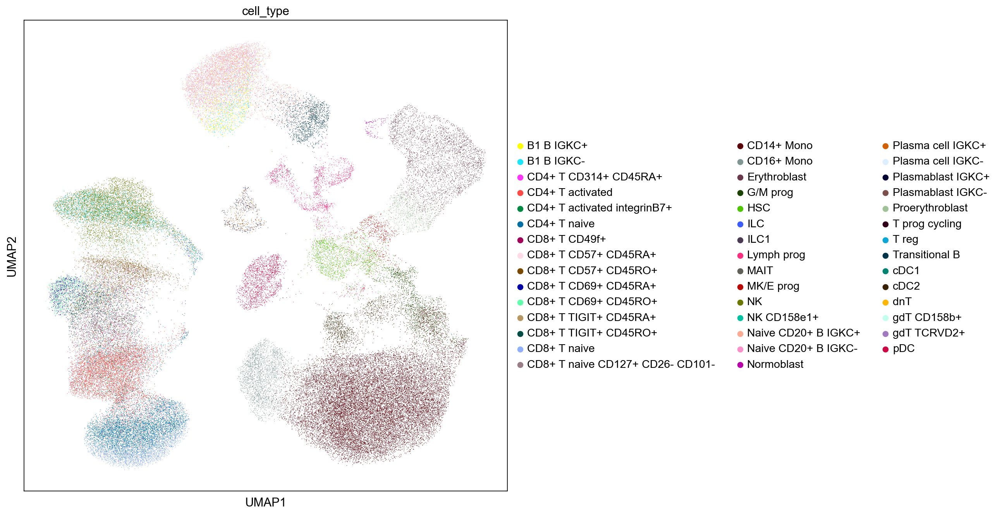

In [9]:
#Whole Neurips dataset plotted

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips_latent, color = ['cell_type'], color_map = 'viridis')

In [17]:
#selecting one sample from Neurips

eg_latent=adata_neurips_latent[adata_neurips_latent.obs['POOL'] == "s4d1"]

In [19]:
#selecting NK cells, gd T cells and ILCs from one sample

nk_latent = eg_latent[(eg_latent.obs['cell_type'] == "NK") | (eg_latent.obs['cell_type'] == "NK CD158e1+") | (eg_latent.obs['cell_type'] == "ILC") | (eg_latent.obs['cell_type'] == "gdT CD158b+")]   


In [20]:
#selecting NK cells, gd T cells and ILCs from whole dataset

nk_all_latent = adata_neurips_latent[(adata_neurips_latent.obs['cell_type'] == "NK") | (adata_neurips_latent.obs['cell_type'] == "NK CD158e1+") | (adata_neurips_latent.obs['cell_type'] == "ILC") | (adata_neurips_latent.obs['cell_type'] == "gdT CD158b+")]   



In [21]:
# Selecting one site

adata_site_latent=adata_neurips_latent[(adata_neurips_latent.obs['Site'] == "site4")].copy() 

In [22]:
#if want to add umap to obsm

#adata_neurips.obsm['umap_latent'] = sc.tl.umap(adata_neurips, copy=True)

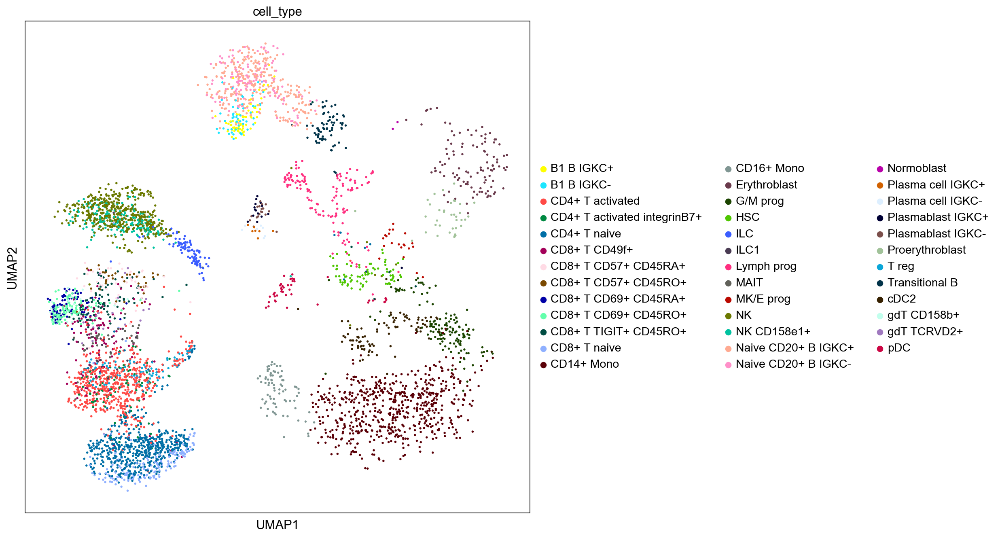

In [23]:
# Selected sample

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(eg_latent, color = ['cell_type'])

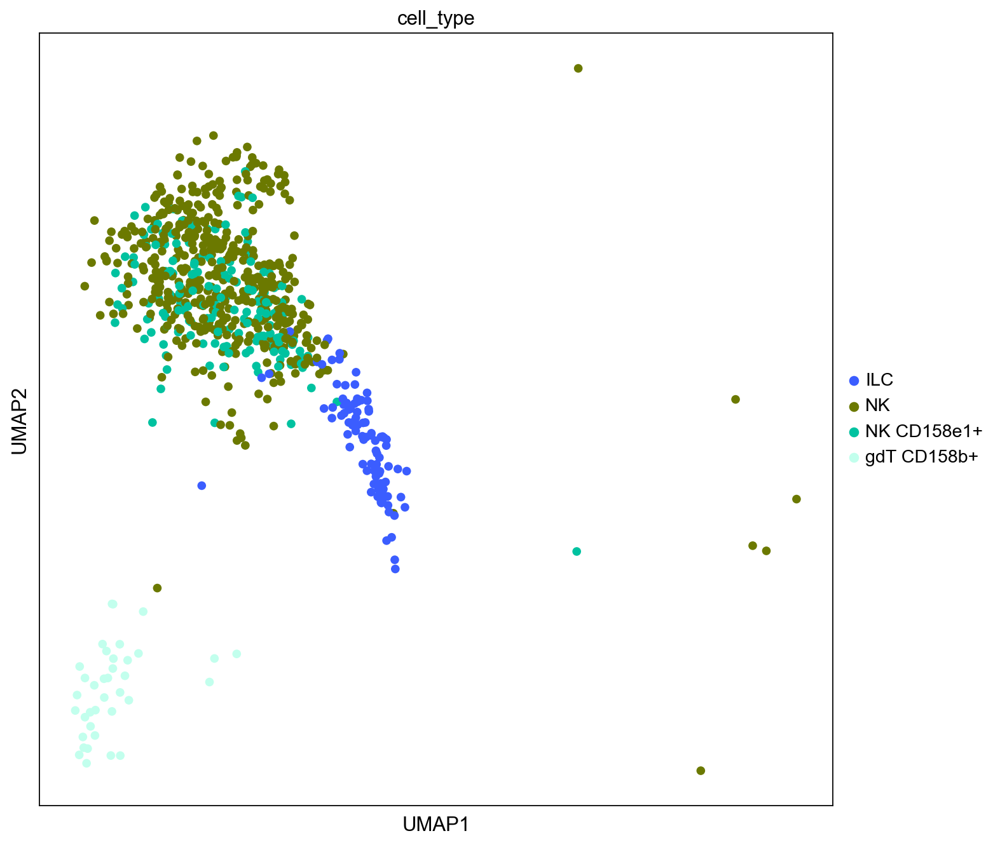

In [24]:
# NK cells from selected sample

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(nk_latent, color = ['cell_type'])

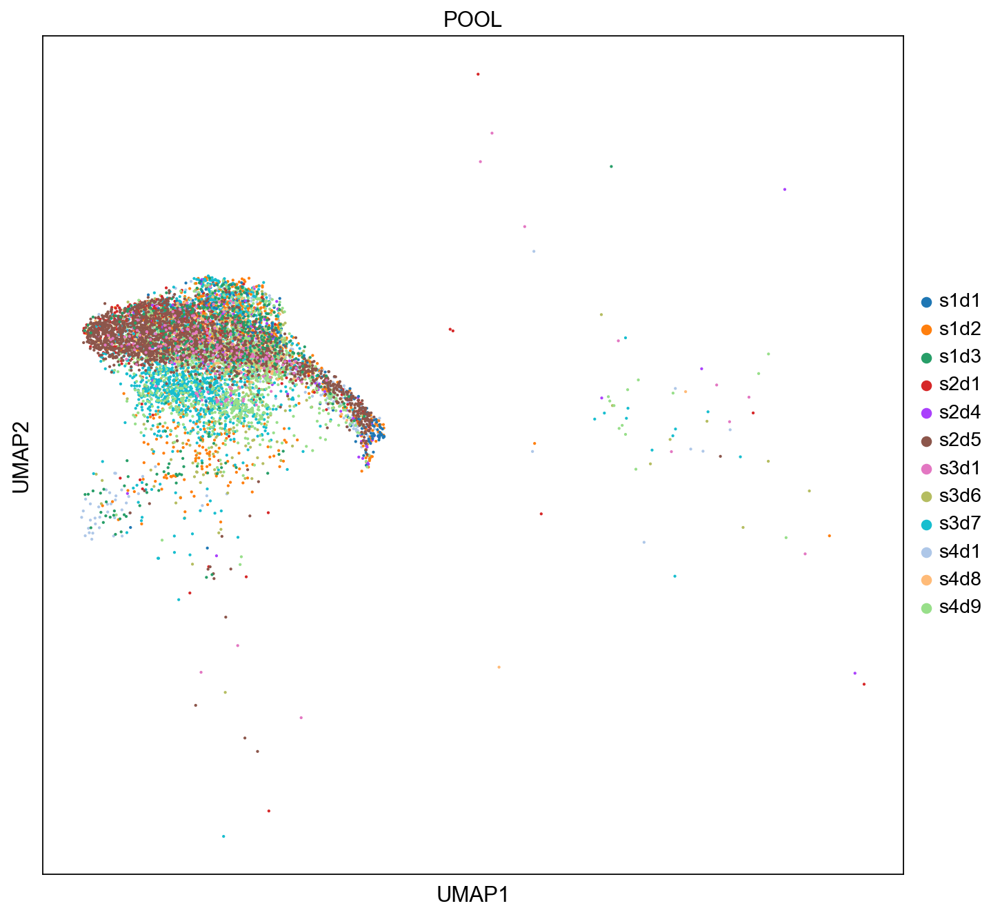

In [25]:
# NK cells from Neurips dataset, coloured by samples

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(nk_all_latent, color = ['POOL'])

## 1.2 Leiden clusters, latent space

In [72]:
#38 cell types annotated in Neurips

sc.tl.leiden(adata_neurips, resolution = 2.3) #default resolution = 1.0

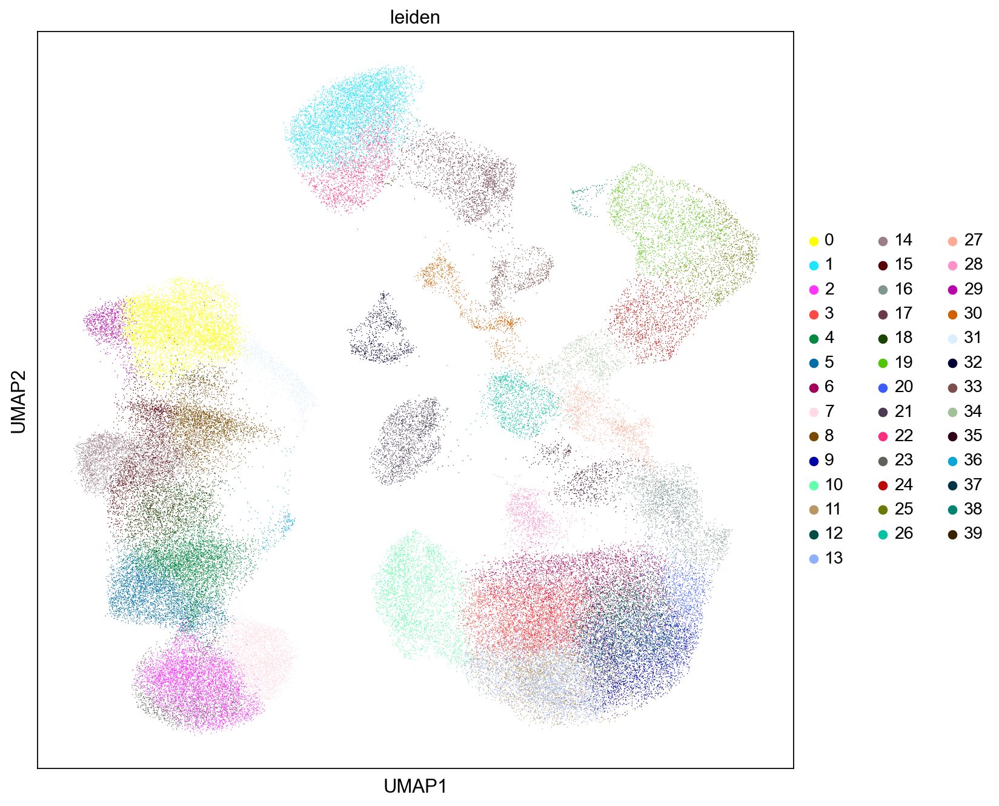

In [73]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips, color = ['leiden'], color_map = 'viridis')

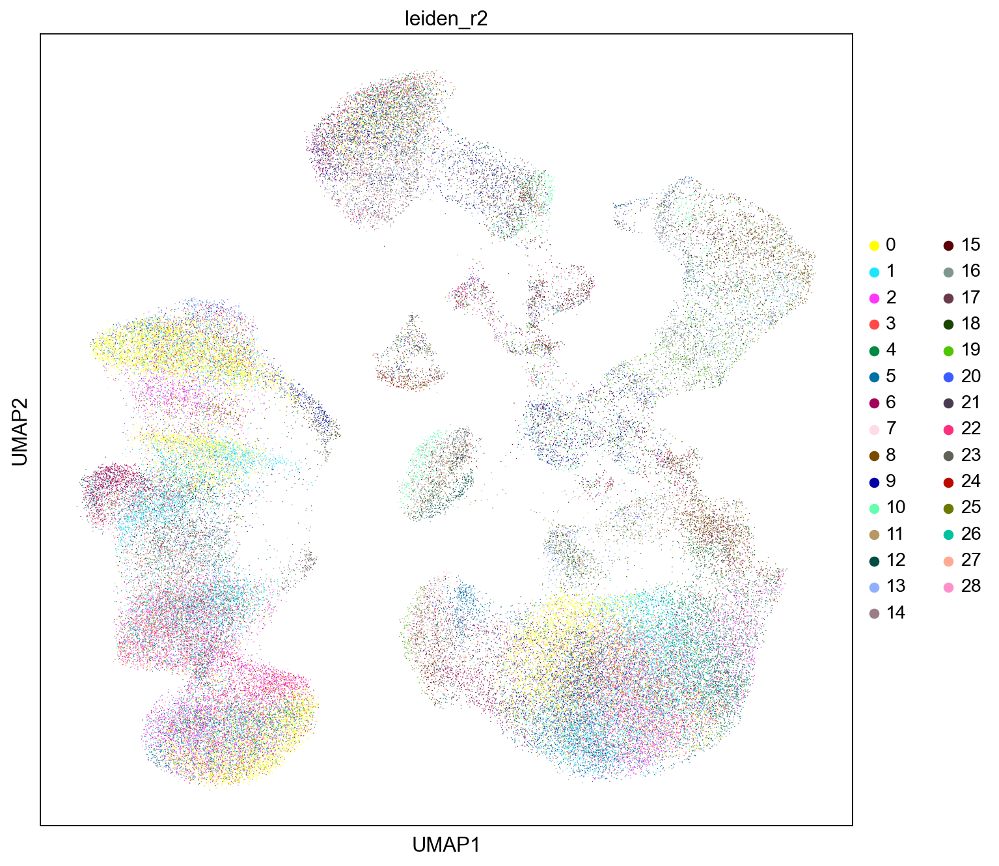

In [74]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips, color = ['leiden_r2'], color_map = 'viridis')

# 2. CLR transformed protein data

## 2.1. UMAPs, protein

In [26]:
#Neurips

adata_neurips_prot = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad').copy()

In [27]:
#Computing a neighborhood of observations using CLR transformed protein data

sc.pp.neighbors(adata_neurips_prot, use_rep="protein_expression_clr_neurips") 

sc.tl.umap(adata_neurips_prot)

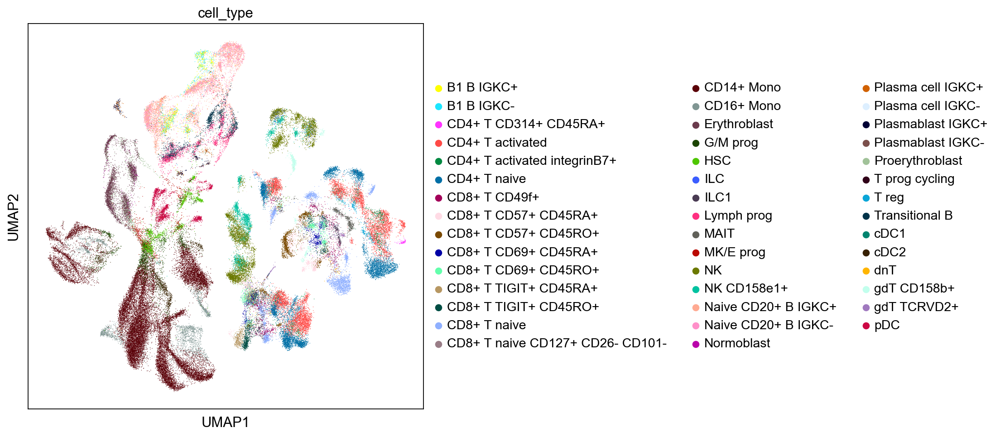

In [28]:
#whole Neurips dataset, coloured by samples

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(adata_neurips_prot, color = ['cell_type'], color_map = 'viridis')

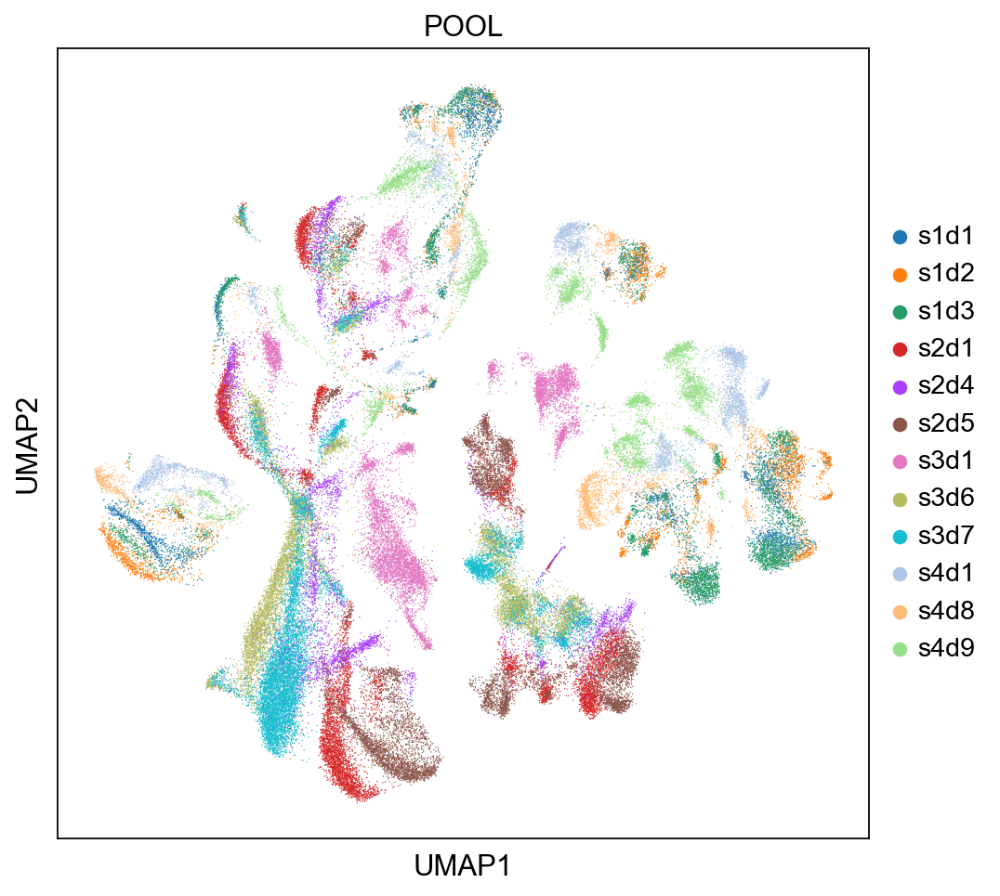

In [29]:
#Whole Neurips dataset, coloured by samples

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(adata_neurips_prot, color = ['POOL'], color_map = 'viridis')

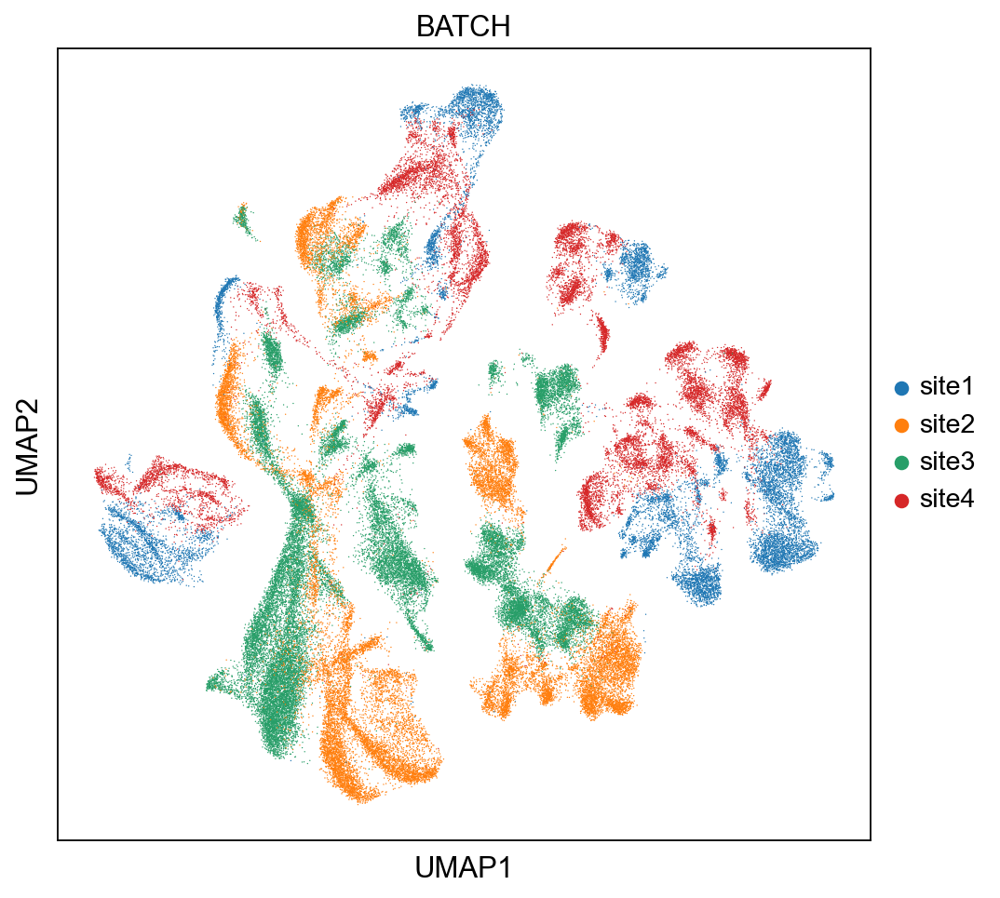

In [30]:
#Whole Neurips dataset, coloured by batch (site)

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(adata_neurips_prot, color = ['BATCH'], color_map = 'viridis')

In [31]:
#selecting one sample from Neurips

eg_prot=adata_neurips_prot[adata_neurips_prot.obs['POOL'] == "s4d1"]

In [32]:
#selecting NK cells, gd T cells and ILCs from one sample

nk_prot = eg_prot[(eg_prot.obs['cell_type'] == "NK") | (eg_prot.obs['cell_type'] == "NK CD158e1+") | (eg_prot.obs['cell_type'] == "ILC") | (eg_prot.obs['cell_type'] == "gdT CD158b+")]   

In [33]:
#selecting NK cells, gd T cells and ILCs from whole dataset

nk_all_prot = adata_neurips_prot[(adata_neurips_prot.obs['cell_type'] == "NK") | (adata_neurips_prot.obs['cell_type'] == "NK CD158e1+") | (adata_neurips_prot.obs['cell_type'] == "ILC") | (adata_neurips_prot.obs['cell_type'] == "gdT CD158b+")]   

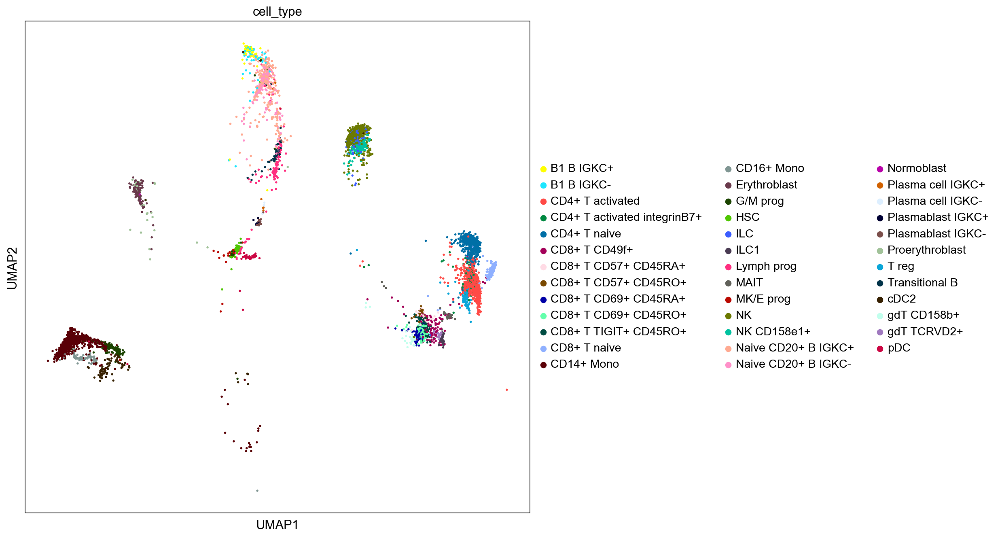

In [34]:
#Only selected sample

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(eg_prot, color = ['cell_type'], color_map = 'viridis')

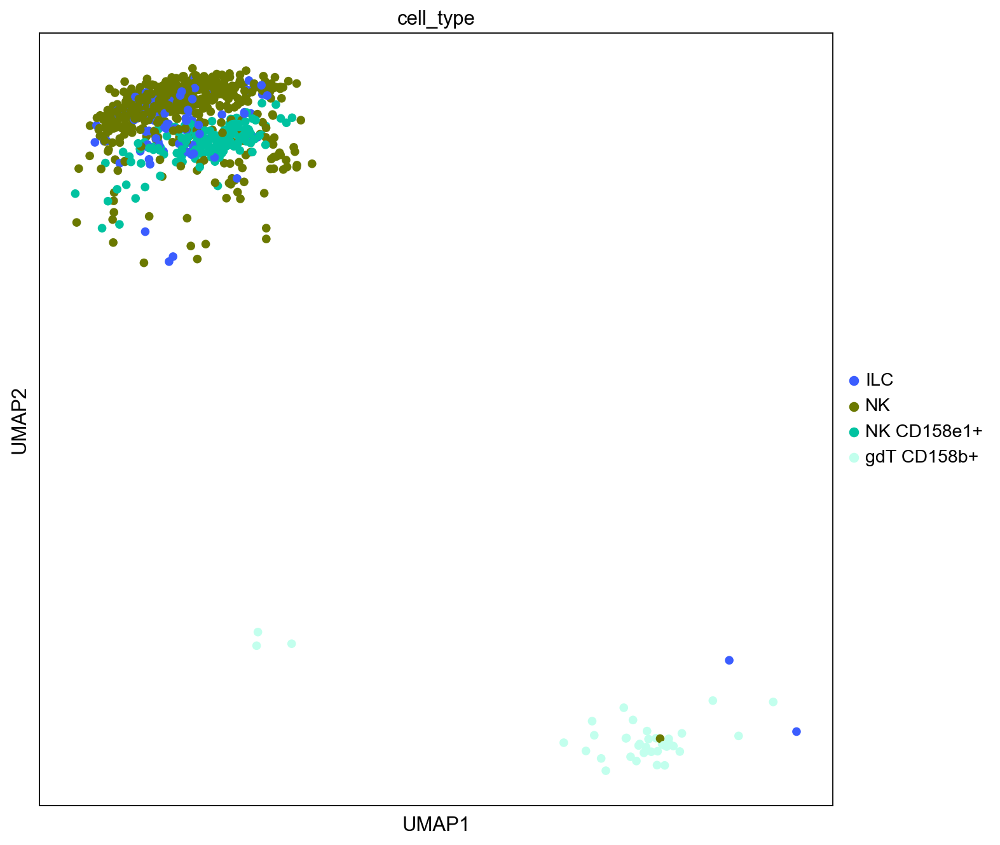

In [35]:
# selected cell types from one sample

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(nk_prot, color = ['cell_type'], color_map = 'viridis')

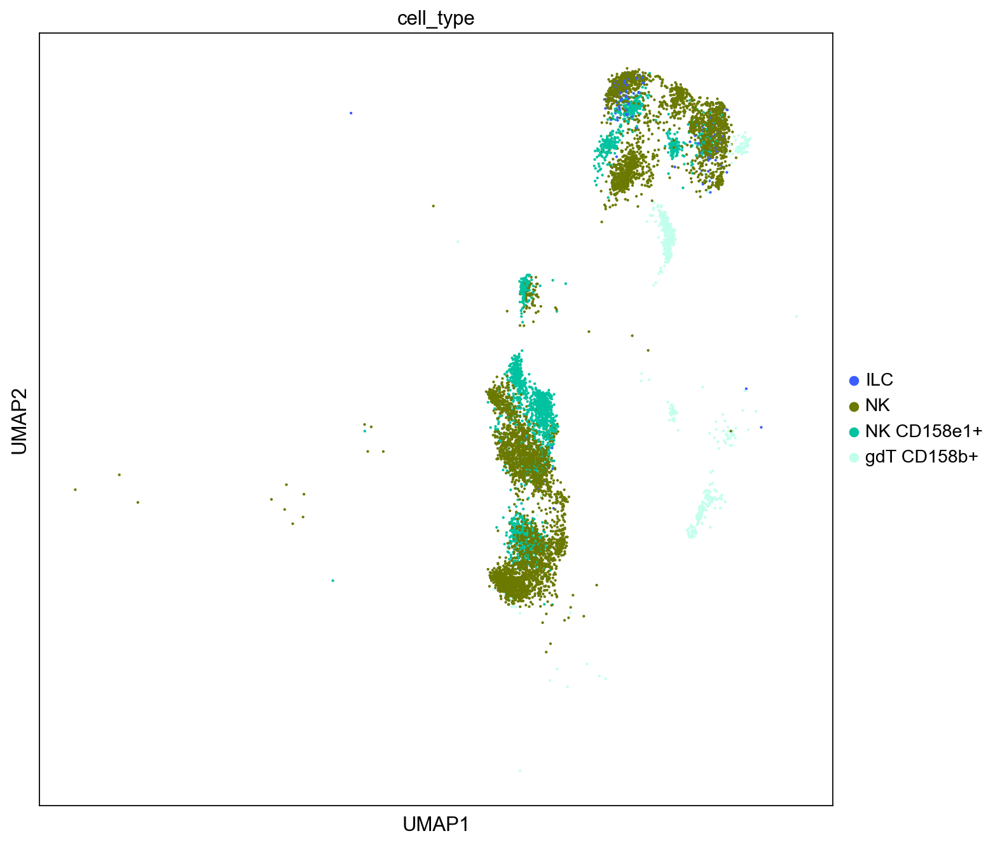

In [36]:
# NK cells from Neurips dataset, all samples, coloured by cell type

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(nk_all_prot, color = ['cell_type'], color_map = 'viridis')

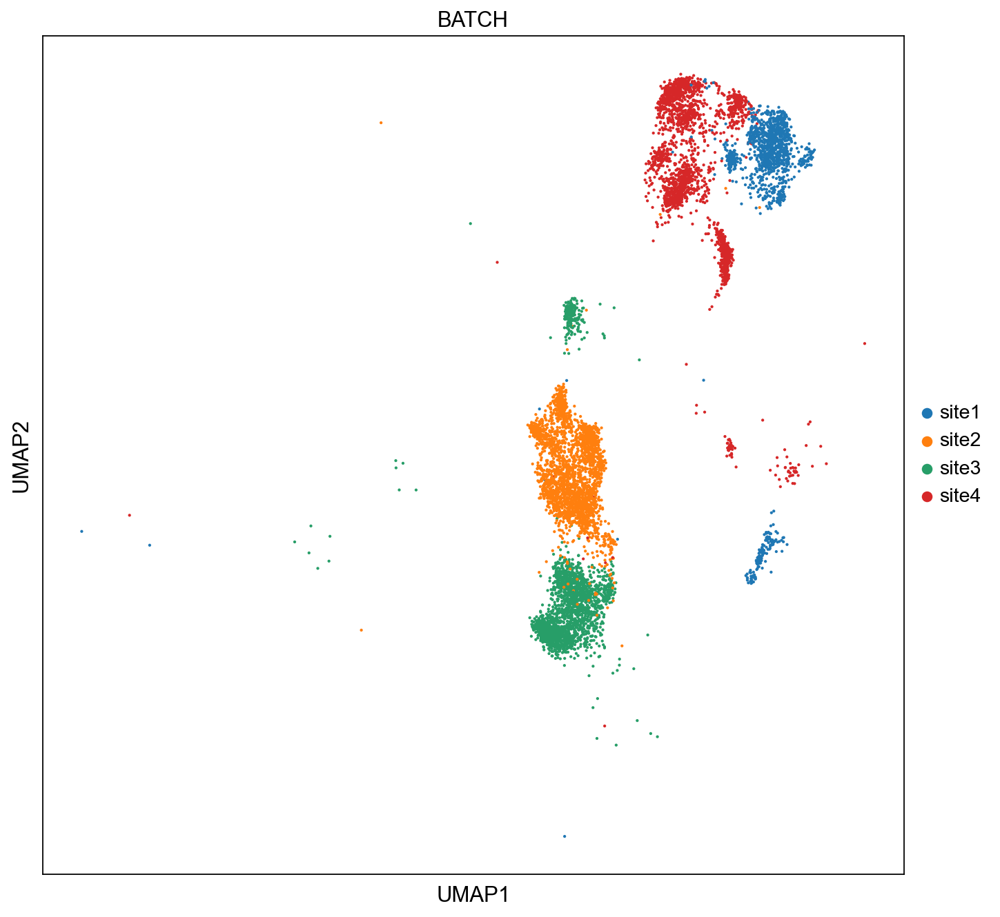

In [37]:
# NK cells from Neurips dataset, all samples, coloured by batch (site)

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(nk_all_prot, color = ['BATCH'], color_map = 'viridis')

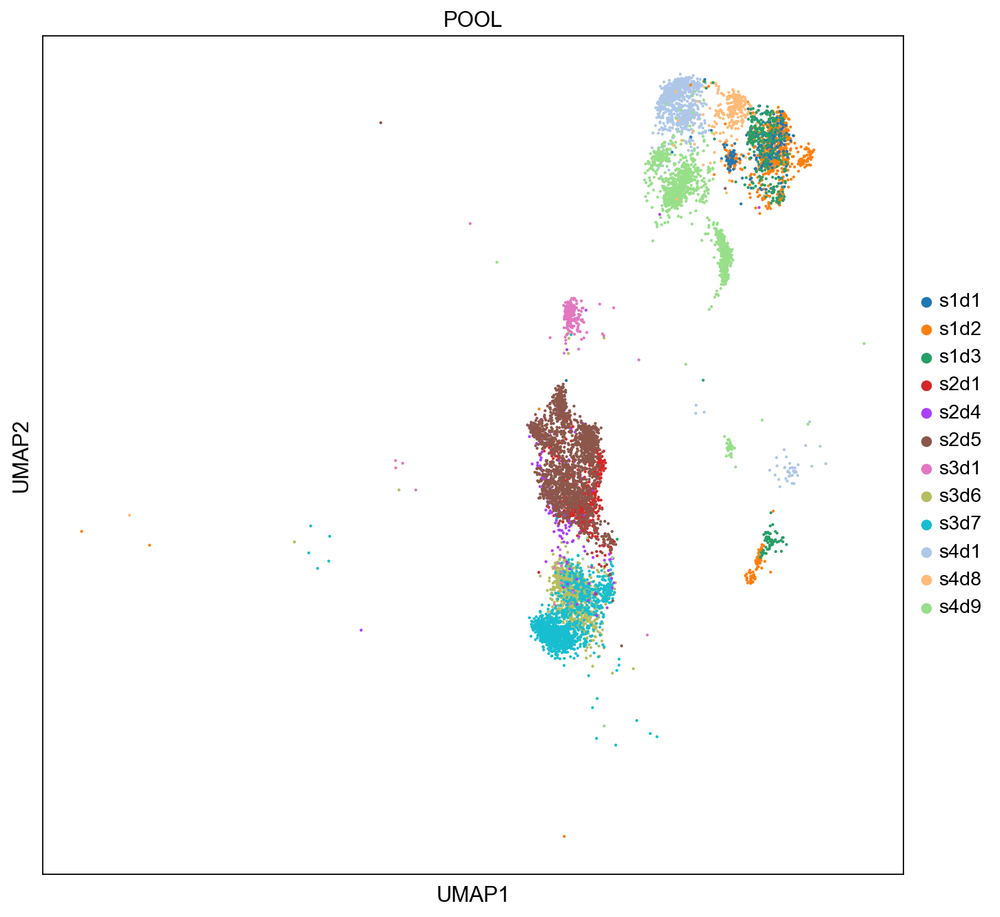

In [38]:
# NK cells from Neurips dataset, all samples, coloured by sample

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(nk_all_prot, color = ['POOL'], color_map = 'viridis')

## 2.2 Leiden, protein

In [75]:
sc.tl.leiden(adata_neurips_prot, resolution = 0.6) #default resolution = 1.0

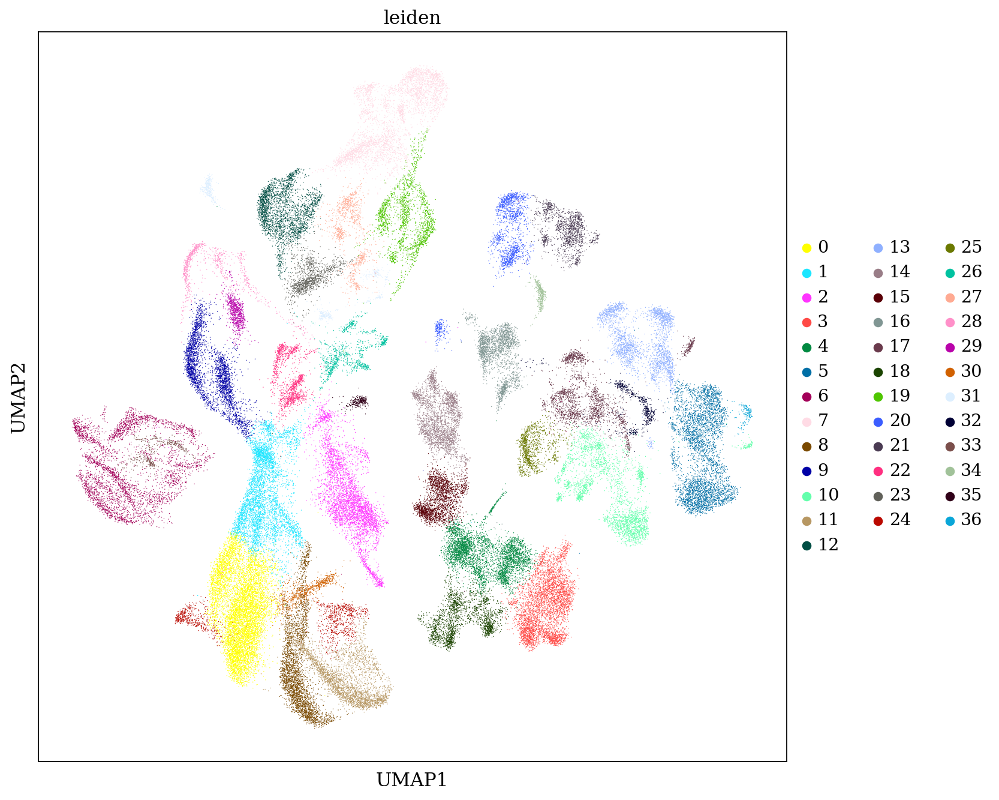

In [76]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips_prot, color = ['leiden'], color_map = 'viridis')

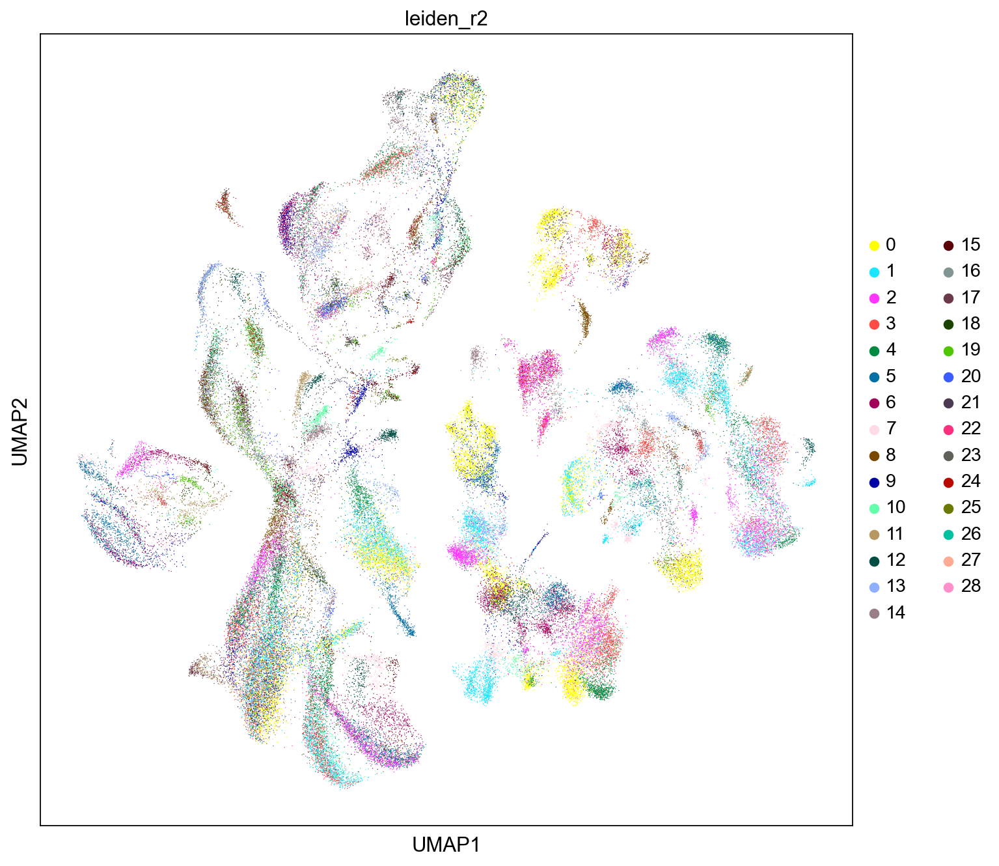

In [42]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips_prot, color = ['leiden_r2'], color_map = 'viridis')

In [24]:
sc.pp.neighbors(adata_site4, use_rep="protein_expression_clr_neurips") 

sc.tl.umap(adata_site4)

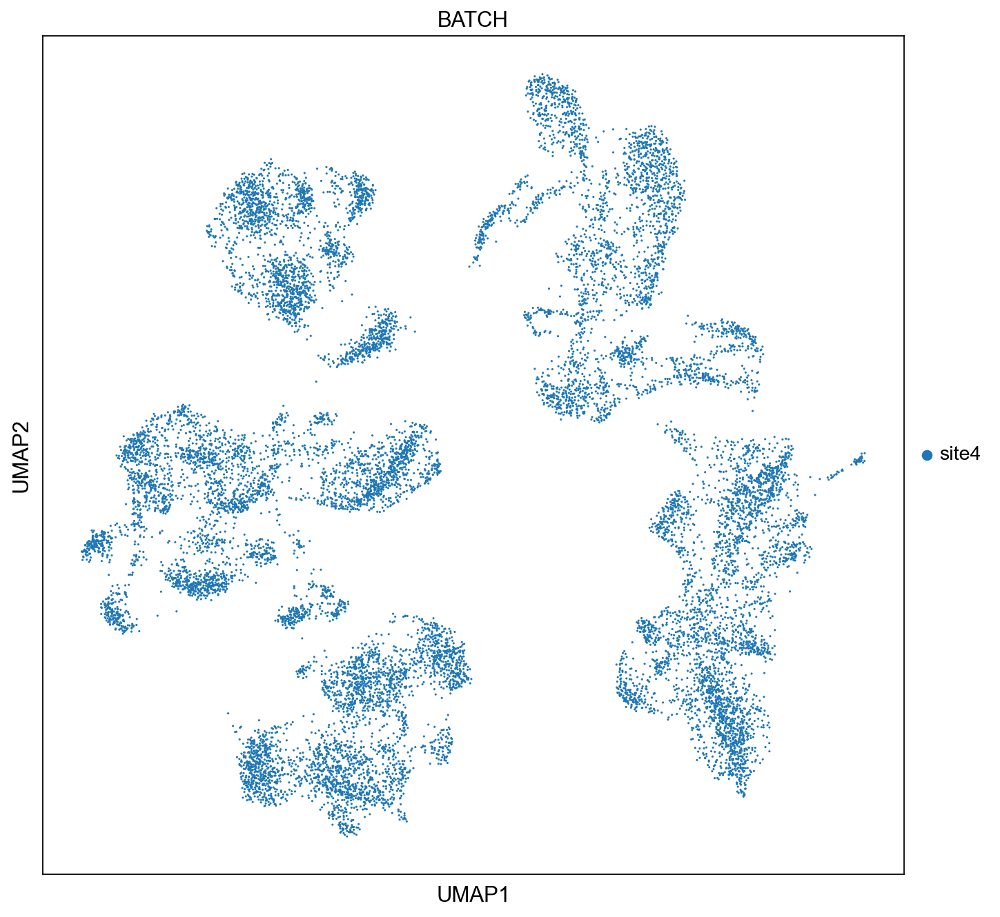

In [26]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_site4, color = ['BATCH'], color_map = 'viridis')

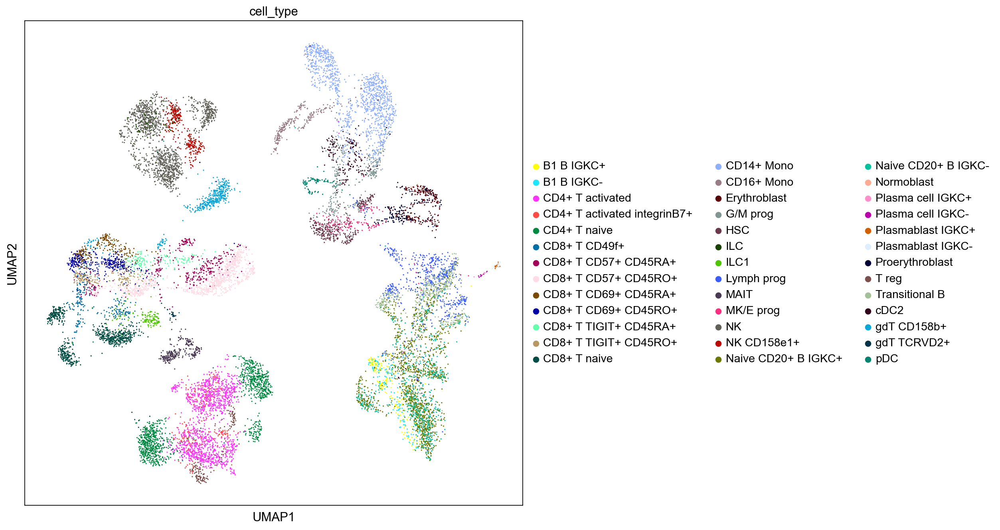

In [27]:
sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_site4, color = ['cell_type'], color_map = 'viridis')

# 3. RNA expression

## 3.1. UMAPs, RNA expression

In [60]:
#Neurips

adata_neurips_rna = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad').copy()

In [61]:
import scipy.sparse

In [62]:
#loading in connectivities matrix (calculated from RNA expression) 

connect = scipy.sparse.load_npz('/Users/tiinatuononen/Desktop/Thesis/Project/data/connectivities (1).npz')

In [63]:
connect

<80998x80998 sparse matrix of type '<class 'numpy.float32'>'
	with 2261244 stored elements in Compressed Sparse Row format>

In [64]:
#addint connectivities matrix to obsm 

adata_neurips_rna.obsp['connectivities'] = connect

In [65]:
adata_neurips_rna

AnnData object with n_obs × n_vars = 80998 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'
    obsp: 'connectivities'

In [66]:
#loading in distance matrix (calculated from RNA expression)

dist = scipy.sparse.load_npz('/Users/tiinatuononen/Desktop/Thesis/Project/data/distances (1).npz')

In [67]:
dist

<80998x80998 sparse matrix of type '<class 'numpy.float64'>'
	with 1133972 stored elements in Compressed Sparse Row format>

In [68]:
adata_neurips_rna.obsp['distances'] = dist

In [48]:
adata_neurips_rna

AnnData object with n_obs × n_vars = 80998 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [69]:
sc.tl.umap(adata_neurips_rna)

ValueError: Did not find .uns["neighbors"]. Run `sc.pp.neighbors` first.

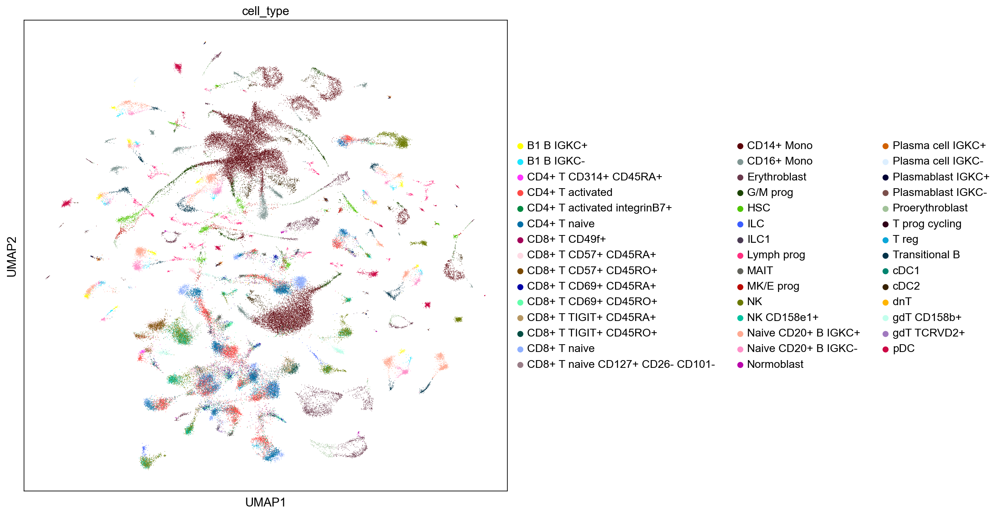

In [53]:
#wWhole Neurips dataset

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips_rna, color = ['cell_type'], color_map = 'viridis')

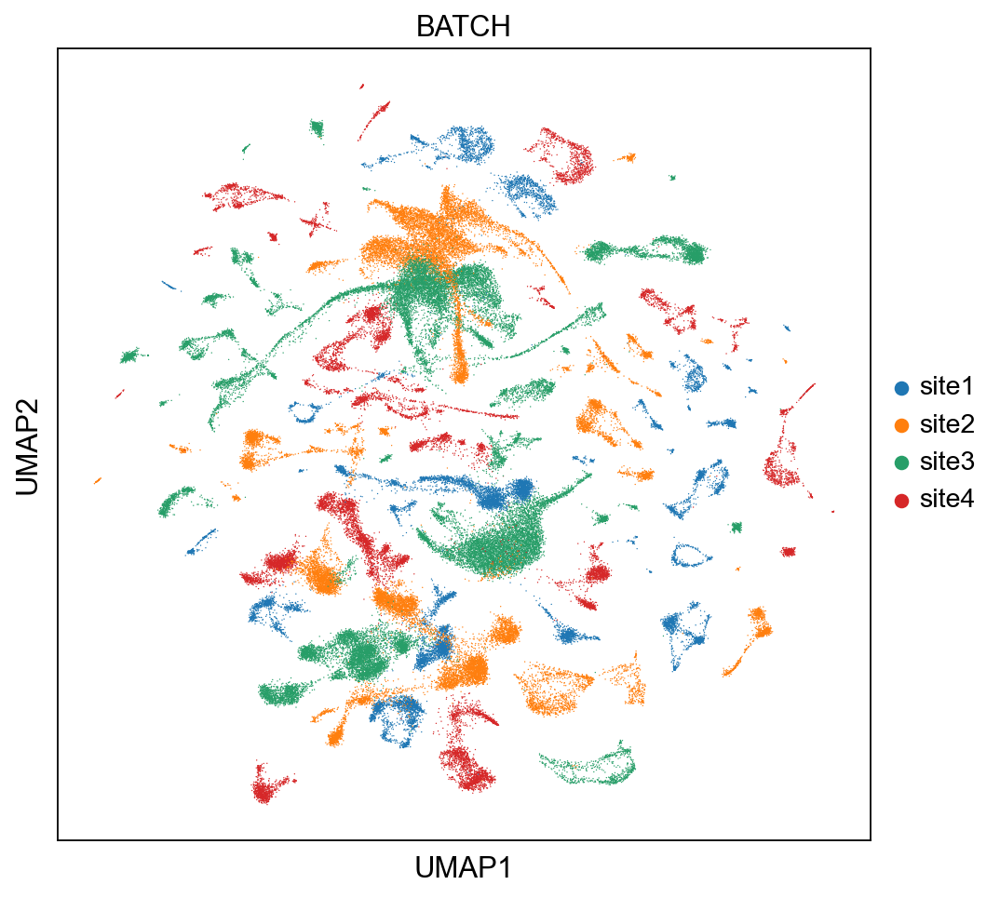

In [54]:
#whole Neurips dataset, coloured by batch (site)

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(adata_neurips_rna, color = ['BATCH'], color_map = 'viridis')

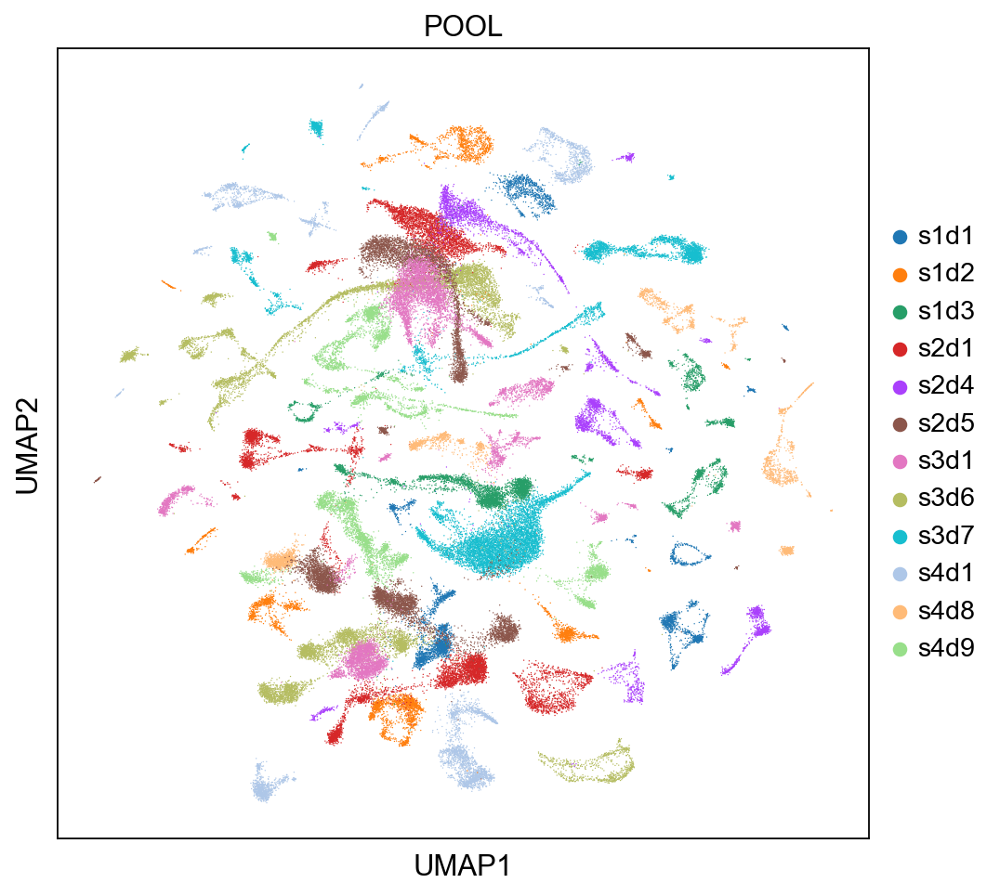

In [55]:
#whole Neurips dataset, coloured by sample

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(adata_neurips_rna, color = ['POOL'], color_map = 'viridis')

In [56]:
#selecting one sample from Neurips

eg_rna=adata_neurips_rna[adata_neurips_rna.obs['POOL'] == "s4d1"]

In [57]:
#selecting NK cells, gd T cells and ILCs from one sample

nk_rna = eg_rna[(eg_rna.obs['cell_type'] == "NK") | (eg_rna.obs['cell_type'] == "NK CD158e1+") | (eg_rna.obs['cell_type'] == "ILC") | (eg_rna.obs['cell_type'] == "gdT CD158b+")]   

In [58]:
#selecting NK cells, gd T cells and ILCs

nk_all_rna = adata_neurips_rna[(adata_neurips_rna.obs['cell_type'] == "NK") | (adata_neurips_rna.obs['cell_type'] == "NK CD158e1+") | (adata_neurips_rna.obs['cell_type'] == "ILC") | (adata_neurips_rna.obs['cell_type'] == "gdT CD158b+")]   

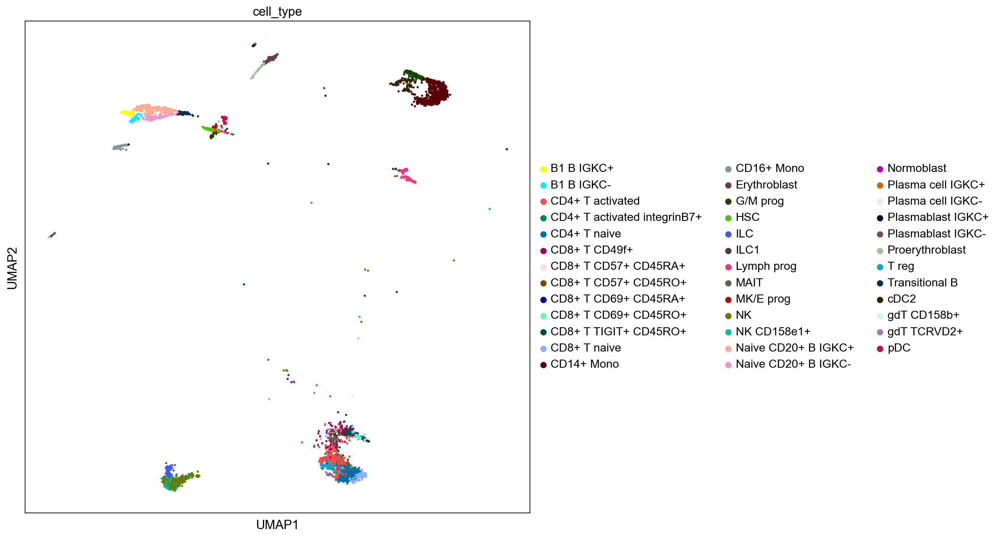

In [59]:
#Selected sample, all cell types

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(eg_rna, color = ['cell_type'], color_map = 'viridis')

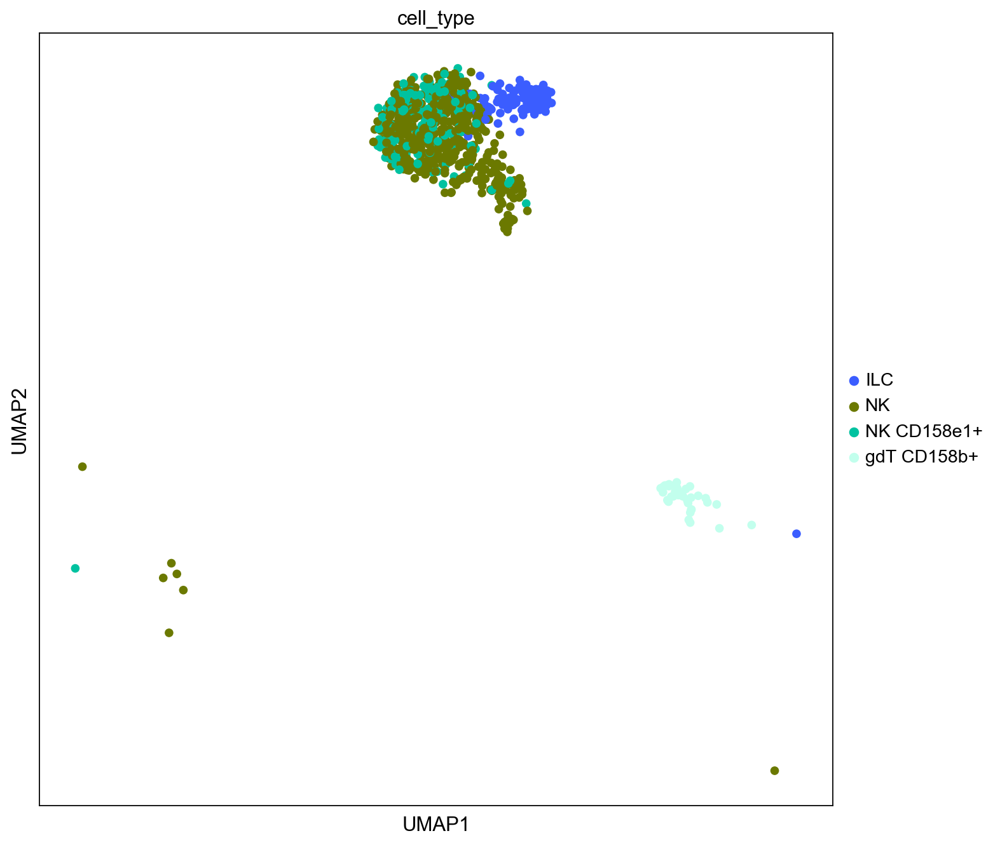

In [80]:
#selected sample, only selected cell types

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(nk_rna, color = ['cell_type'], color_map = 'viridis')

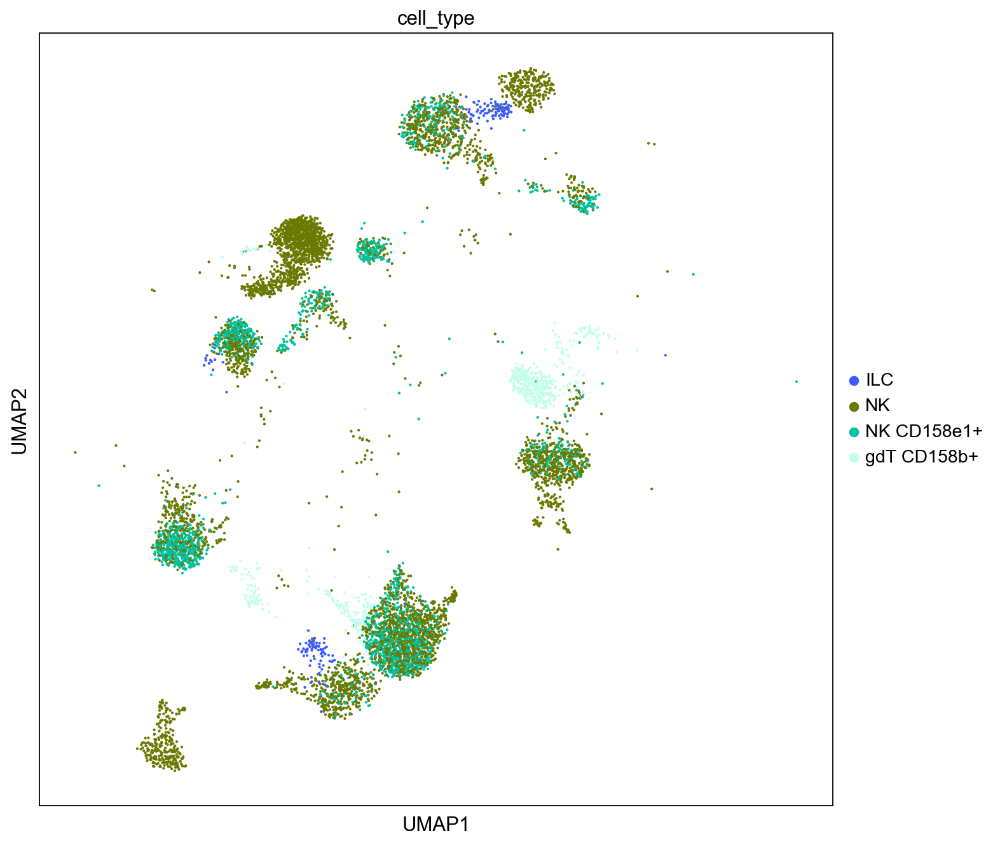

In [81]:
#whole dataset, only selected cell types

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(nk_all_rna, color = ['cell_type'], color_map = 'viridis')

## 3.2. Leiden, RNA

# 4. Sankey plots

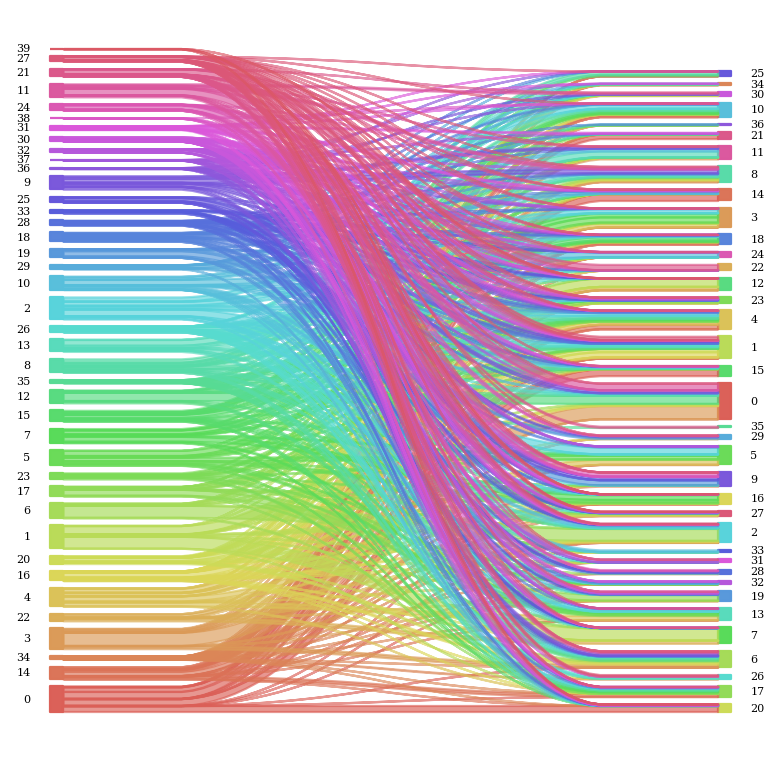

In [85]:
sankey.sankey(adata_neurips.obs.leiden, adata_neurips_prot.obs.leiden, aspect=20, fontsize=5)

In [ ]:
sankey.sankey(adata_neurips.obs.leiden, adata_neurips_prot.obs.leiden, aspect=20, fontsize=5)